In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import pandas as pd 
import numpy as np 
import statsmodels.api as sm
import plotly.express as px

In [2]:
df=pd.read_csv('weatherAUS.csv')
df.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No


In [3]:
df.drop(['Evaporation','Sunshine','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','RainToday','RainTomorrow'], axis=1,inplace=True)
df.transpose()
df.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Temp9am,Temp3pm
0,2008-12-01,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,16.9,21.8
1,2008-12-02,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,17.2,24.3
2,2008-12-03,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,21.0,23.2


In [4]:
df.dropna(subset=['WindGustDir','WindDir9am','WindDir3pm'], inplace=True)

In [5]:
# nummer,winden=[],[]
# for no,wind in enumerate(df.WindDir3pm.unique()):
#     nummer.append(no)
#     winden.append(wind)
# zipped = zip(nummer, winden)
# list(zipped)

In [6]:
# df['WindGustDir']= df['WindGustDir'].replace(winden,nummer)
# df['WindDir9am']= df['WindDir9am'].replace(winden,nummer)
# df['WindDir3pm']= df['WindDir3pm'].replace(winden,nummer)
# df.head(3)

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,126207.0,12.426689,6.355223,-8.5,7.8,12.2,17.1,33.9
MaxTemp,126302.0,23.470226,7.195478,-4.8,18.1,23.0,28.6,48.1
Rainfall,124513.0,2.383929,8.539371,0.0,0.0,0.0,0.8,367.6
WindGustSpeed,126840.0,40.745341,13.415432,7.0,31.0,39.0,48.0,135.0
WindSpeed9am,126840.0,15.062922,8.336738,2.0,9.0,13.0,20.0,87.0
WindSpeed3pm,126840.0,19.207064,8.581574,2.0,13.0,19.0,24.0,87.0
Temp9am,126005.0,17.272962,6.473855,-7.2,12.5,16.9,21.9,40.2
Temp3pm,125551.0,21.892045,7.017182,-5.4,16.7,21.4,26.7,46.7


In [8]:
a=df.corr()
a

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.738613,0.099852,0.141477,0.137919,0.153130,0.898407,0.711714
MaxTemp,0.738613,1.000000,-0.080156,0.037489,-0.015268,0.023309,0.891986,0.984840
Rainfall,0.099852,-0.080156,1.000000,0.131662,0.086050,0.060453,0.004071,-0.084516
WindGustSpeed,0.141477,0.037489,0.131662,1.000000,0.592574,0.675474,0.108123,0.003161
WindSpeed9am,0.137919,-0.015268,0.086050,0.592574,1.000000,0.503852,0.081126,-0.024559
WindSpeed3pm,0.153130,0.023309,0.060453,0.675474,0.503852,1.000000,0.132037,0.002006
Temp9am,0.898407,0.891986,0.004071,0.108123,0.081126,0.132037,1.000000,0.866221
Temp3pm,0.711714,0.984840,-0.084516,0.003161,-0.024559,0.002006,0.866221,1.000000


In [9]:
a[a['MaxTemp']>0.8] #correlation greater than 80% (multiple linearity)

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Temp9am,Temp3pm
MaxTemp,0.738613,1.000000,-0.080156,0.037489,-0.015268,0.023309,0.891986,0.984840
Temp9am,0.898407,0.891986,0.004071,0.108123,0.081126,0.132037,1.000000,0.866221
Temp3pm,0.711714,0.984840,-0.084516,0.003161,-0.024559,0.002006,0.866221,1.000000


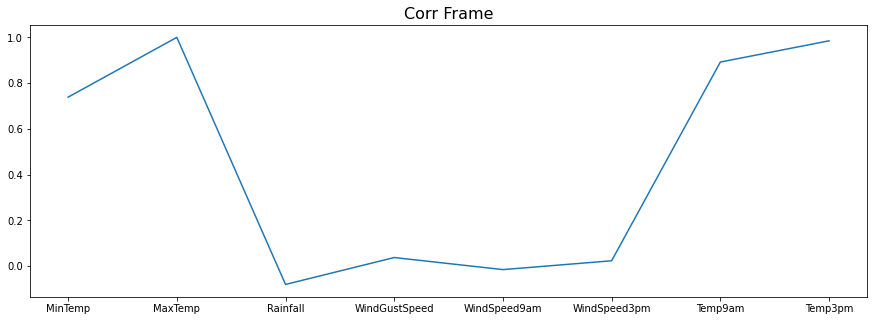

In [10]:
plt.figure(figsize=(15,5) )
plt.title('Corr Frame', fontsize='16')
plt.plot(a.MaxTemp)
plt.show()

In [11]:
fig=px.box(df,y=[i for i in a.columns if i!='MaxTemp'],title='independet variables')
fig.show()

<AxesSubplot:>

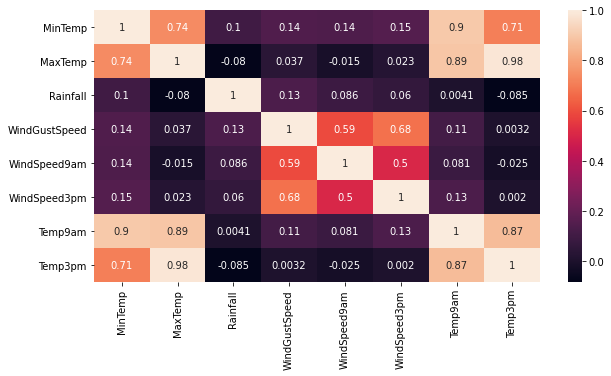

In [12]:
fig=plt.subplots(figsize=(10,5))   
sns.heatmap(df.corr(), annot=True)


In [13]:
df.dropna(inplace=True)

In [14]:
X=pd.get_dummies(data=df, columns=['WindGustDir','WindDir9am','WindDir3pm'],drop_first=True)
X=X.drop(['MaxTemp','Date','Location'],axis=1)
X

,MinTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Temp9am,Temp3pm,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,0.6,44.0,20.0,24.0,16.9,21.8,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,7.4,0.0,44.0,4.0,22.0,17.2,24.3,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,12.9,0.0,46.0,19.0,26.0,21.0,23.2,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,9.2,0.0,24.0,11.0,9.0,18.1,26.5,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,17.5,1.0,41.0,7.0,20.0,17.8,29.7,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,3.5,0.0,31.0,15.0,13.0,9.4,20.9,0,0,0,...,0,0,0,0,0,0,0,0,0,0
145455,2.8,0.0,31.0,13.0,11.0,10.1,22.4,0,0,0,...,0,0,0,0,0,0,0,0,0,0
145456,3.6,0.0,22.0,13.0,9.0,10.9,24.5,0,0,0,...,0,0,0,0,0,0,0,0,0,0
145457,5.4,0.0,37.0,9.0,9.0,12.5,26.1,0,0,1,...,0,0,0,0,0,0,0,0,1,0


In [15]:
y=df['MaxTemp']

In [16]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2, random_state=42)

In [17]:
print(f'X_train:{np.shape(X_train)} y_train:{np.shape(y_train)} X_test{X_test} y_test{np.shape(y_test)}')

X_train:(98698, 52) y_train:(98698,) X_test        MinTemp  Rainfall  WindGustSpeed  WindSpeed9am  WindSpeed3pm  Temp9am  \
122832     11.6       0.0           31.0          13.0          11.0     22.0   
56598       7.7       0.0           43.0          26.0          11.0     10.2   
66479       6.5       1.8           57.0          20.0          30.0      6.7   
90587      17.7       0.0           30.0          17.0          22.0     25.1   
14788       6.5       0.0           30.0           7.0          15.0     14.7   
...         ...       ...            ...           ...           ...      ...   
121172     13.7       0.0           41.0          17.0          15.0     18.9   
61213      18.7       0.8           44.0          24.0          30.0     18.8   
114871     10.5       0.0           43.0          15.0          20.0     15.3   
29479       2.3       0.0           39.0           7.0          24.0      6.0   
13733      18.9       0.0           46.0          33.0          26

In [18]:
lm=sm.OLS(y_train,X_train)
model=lm.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                MaxTemp   R-squared (uncentered):                   0.998
Model:                            OLS   Adj. R-squared (uncentered):              0.998
Method:                 Least Squares   F-statistic:                          9.697e+05
Date:                Fri, 02 Jul 2021   Prob (F-statistic):                        0.00
Time:                        00:21:30   Log-Likelihood:                     -1.4796e+05
No. Observations:               98698   AIC:                                  2.960e+05
Df Residuals:                   98646   BIC:                                  2.965e+05
Df Model:                          52                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
MinTemp            -0.0446      0.001    -33.321      0.000      -0.047      -0.042
Rainfall           -0.0073      0.000    -16.751      0.000      -0.008      -0.006
WindGustSpeed       0.0270      0.000     69.568      0.000       0.026       0.028
WindSpeed9am       -0.0169      0.001    -31.613      0.000      -0.018      -0.016
WindSpeed3pm       -0.0130      0.001    -22.806      0.000      -0.014      -0.012
Temp9am             0.2155      0.002    116.937      0.000       0.212       0.219
Temp3pm             0.8692      0.001    828.894      0.000       0.867       0.871
WindGustDir_ENE     0.2421      0.019     12.700      0.000       0.205       0.280
WindGustDir_ESE     0.1986      0.020     10.160      0.000       0.160       0.237
WindGustDir_N       0.2716      0.021     12.735      0.000       0.230       0.313
WindGustDir_NE      0.1829      0.021      8.692      0.000       0.142       0.224
WindGustDir_NNE     0.2775      0.022     12.494      0.000       0.234       0.321
WindGustDir_NNW     0.3579      0.023     15.572      0.000       0.313       0.403
WindGustDir_NW      0.3861      0.022     17.445      0.000       0.343       0.429
WindGustDir_S       0.2636      0.021     12.823      0.000       0.223       0.304
WindGustDir_SE      0.2295      0.019     11.850      0.000       0.192       0.268
WindGustDir_SSE     0.3068      0.020     15.211      0.000       0.267       0.346
WindGustDir_SSW     0.2676      0.021     12.792      0.000       0.227       0.309
WindGustDir_SW      0.2537      0.021     12.050      0.000       0.212       0.295
WindGustDir_W       0.3476      0.021     16.504      0.000       0.306       0.389
WindGustDir_WNW     0.3329      0.022     15.079      0.000       0.290       0.376
WindGustDir_WSW     0.3147      0.021     14.764      0.000       0.273       0.356
WindDir9am_ENE      0.2283      0.019     12.310      0.000       0.192       0.265
WindDir9am_ESE      0.1649      0.019      8.874      0.000       0.128       0.201
WindDir9am_N        0.2660      0.018     14.549      0.000       0.230       0.302
WindDir9am_NE       0.2085      0.019     10.722      0.000       0.170       0.247
WindDir9am_NNE      0.2347      0.019     12.050      0.000       0.197       0.273
WindDir9am_NNW      0.2428      0.020     12.295      0.000       0.204       0.281
WindDir9am_NW       0.1676      0.020      8.565      0.000       0.129       0.206
WindDir9am_S        0.0157      0.019      0.831      0.406      -0.021       0.053
WindDir9am_SE       0.1277      0.018      7.007      0.000       0.092       0.163
WindDir9am_SSE      0.0900      0.018      4.882      0.000       0.054       0.126
WindDir9am_SSW     -0.0420      0.020     -2

In [19]:
guesVl=[]
for i in X.columns:
    if i !='MaxTemp':
        guesVl.append([(X[i][0])])
guesVl

[[13.4],
 [0.6],
 [44.0],
 [20.0],
 [24.0],
 [16.9],
 [21.8],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [1],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [1],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [0],
 [1],
 [0]]

In [20]:
guess=guesVl
guess=pd.DataFrame(guess).T
guess

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,51
0,13.4,0.6,44.0,20.0,24.0,16.9,21.8,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [21]:
model.predict(guess) #reality value 22.9	

0    23.01446
dtype: float64

In [22]:
rmse=np.sqrt(mean_squared_error(y_test,model.predict(X_test)))
rmse

1.067790445773141

In [23]:
'''Model Tuning'''
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2, random_state=42)
reg=LinearRegression()
model= reg.fit(X_train,y_train)
model.score(X_train,y_train)

0.9772557810656417

In [24]:
np.sqrt(mean_squared_error(y_train,model.predict(X_train)))

1.07722266849191

In [25]:
from sklearn.model_selection import cross_val_score
scor=cross_val_score(model,X_train,y_train,cv=10,scoring='r2')
scor.mean()

0.9772177037917589

In [26]:
'''Lasso, Ridge, ElasticNet and Polynomial regressions''' 

'Lasso, Ridge, ElasticNet and Polynomial regressions'

In [27]:
"""Ridge Regresyon"""
from sklearn.linear_model import Ridge
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2, random_state=42)
X_train.shape

(98698, 52)

In [28]:
ridge_model = Ridge().fit(X_train, y_train)
ridge_model

Ridge()

In [29]:
ridge_model.score(X_train,y_train),ridge_model.score(X_test,y_test)

(0.9772557807937592, 0.9779525401670708)

In [30]:
np.sqrt(mean_squared_error(y_train,ridge_model.predict(X_train))), np.sqrt(mean_squared_error(y_test,ridge_model.predict(X_test)))

(1.077222674930425, 1.0610740717183302)

Text(0.5, 1.0, 'Ridge Katsayilari')

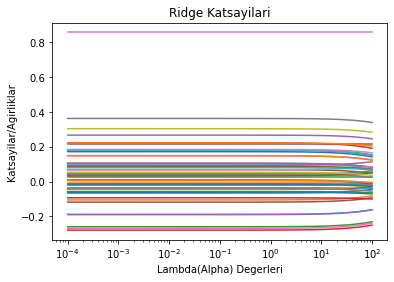

In [31]:
lambdalar=np.linspace(100,0.0001,1000)
ridge_model=Ridge()
kats=[]
for i in lambdalar:
    ridge_model.set_params(alpha=i)
    ridge_model.fit(X_train, y_train)
    kats.append(ridge_model.coef_)
ax=plt.gca()
ax.plot(lambdalar,kats)
ax.set_xscale('log')
plt.xlabel('Lambda(Alpha) Degerleri')
plt.ylabel('Katsayilar/Agirliklar')
plt.title('Ridge Katsayilari')

In [32]:
from sklearn.linear_model import RidgeCV
alphaCV=RidgeCV(alphas=lambdalar,
            scoring='neg_mean_squared_error',
            normalize=True)
alphaCV.fit(X_train,y_train)

RidgeCV(alphas=array([1.00000e+02, 9.98999e+01, 9.97998e+01, 9.96997e+01, 9.95996e+01,
       9.94995e+01, 9.93994e+01, 9.92993e+01, 9.91992e+01, 9.90991e+01,
       9.89990e+01, 9.88989e+01, 9.87988e+01, 9.86987e+01, 9.85986e+01,
       9.84985e+01, 9.83984e+01, 9.82983e+01, 9.81982e+01, 9.80981e+01,
       9.79980e+01, 9.78979e+01, 9.77978e+01, 9.76977e+01, 9.75976e+01,
       9.74975e+01, 9.73974e+01, 9.72...
       2.40250e+00, 2.30240e+00, 2.20230e+00, 2.10220e+00, 2.00210e+00,
       1.90200e+00, 1.80190e+00, 1.70180e+00, 1.60170e+00, 1.50160e+00,
       1.40150e+00, 1.30140e+00, 1.20130e+00, 1.10120e+00, 1.00110e+00,
       9.01000e-01, 8.00900e-01, 7.00800e-01, 6.00700e-01, 5.00600e-01,
       4.00500e-01, 3.00400e-01, 2.00300e-01, 1.00200e-01, 1.00000e-04]),
        normalize=True, scoring='neg_mean_squared_error')

In [33]:
alphaCV.alpha_

0.0001

In [34]:
ridge_tuned=Ridge(alpha=alphaCV.alpha_,normalize=True).fit(X_train,y_train)

In [35]:
ridge_tuned.score(X_train,y_train)

0.9772557585989918

In [36]:
'''Lasso Regression'''
from sklearn.linear_model import Lasso
lasso_model = Lasso().fit(X_train, y_train)
lasso_model


Lasso()

In [37]:
lasso_model.score(X_train, y_train) , lasso_model.score(X_test, y_test)

(0.975347064315832, 0.9761762686435883)

In [38]:
np.sqrt(mean_squared_error(y_train, lasso_model.predict(X_train))) , np.sqrt(mean_squared_error(y_test, lasso_model.predict(X_test)))

(1.121512947274833, 1.1029893367167212)

In [39]:
np.sum(lasso_model.coef_!=0)

3

In [40]:
lasso_model.coef_

array([ 0.        , -0.        ,  0.00791036, -0.        , -0.        ,
        0.14176021,  0.86971071, -0.        , -0.        , -0.        ,
       -0.        ,  0.        ,  0.        ,  0.        , -0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        ,  0.        , -0.        , -0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ])

In [41]:
from sklearn.linear_model import LassoCV
lasso_model_cv = LassoCV(alphas = None, cv = 10, max_iter = 10000, normalize = True)
lasso_model_cv.fit(X_train, y_train)

LassoCV(cv=10, max_iter=10000, normalize=True)

In [42]:
lasso_model_cv.alpha_ #optimum alpha

2.2388070536266738e-05

In [43]:
lasso_optimum = Lasso(alpha= lasso_model_cv.alpha_) 
lasso_optimum.fit(X_train, y_train)

Lasso(alpha=2.2388070536266738e-05)

In [44]:
lasso_optimum.score(X_train, y_train) , lasso_optimum.score(X_test, y_test)

(0.9772557224945776, 0.977952373766526)

In [45]:
np.sqrt(mean_squared_error(y_train, lasso_model_cv.predict(X_train))) , np.sqrt(mean_squared_error(y_test, lasso_model_cv.predict(X_test)))

(1.0793614841664845, 1.062742729486464)

In [46]:
'''Elasticnet Regression'''
from sklearn.linear_model import ElasticNet
elas_model = ElasticNet().fit(X_train, y_train)
elas_model.coef_ , elas_model.intercept_

(array([ 0.        , -0.0042045 ,  0.01186646, -0.00732791, -0.        ,
         0.17751151,  0.8421298 , -0.        , -0.        ,  0.        ,
        -0.        ,  0.        ,  0.        ,  0.        , -0.        ,
        -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        , -0.        ,
        -0.        , -0.        , -0.        , -0.        , -0.        ,
        -0.        , -0.        , -0.        , -0.        ,  0.        ,
        -0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        -0.        ,  0.        ]),
 1.5707061222123535)

In [47]:
elas_model.score(X_train, y_train) , elas_model.score(X_test, y_test) 

(0.9757834737195544, 0.9765070093795842)

In [48]:
y_tahmin = elas_model.predict(X_test)
y_tahmin

array([29.32819118, 20.29101264, 11.70359306, ..., 20.18215963,
       19.04773792, 34.55029501])

In [49]:
np.sqrt(mean_squared_error(y_test, y_tahmin)) 

1.0953062729005762

In [50]:
np.sqrt(mean_squared_error(y_train, elas_model.predict(X_train))), np.sqrt(mean_squared_error(y_test, elas_model.predict(X_test)))

(1.1115420412483905, 1.0953062729005762)

In [51]:
from sklearn.linear_model import ElasticNetCV #model tuning
elas_model_cv= ElasticNetCV(cv=10, random_state = 42).fit(X_train,y_train)

In [52]:
elas_model_cv.alpha_

0.09862315139144406

In [53]:
elas_model_cv.coef_

array([-0.03181014, -0.00830807,  0.02412011, -0.01715944, -0.0117017 ,
        0.20448766,  0.85714701, -0.        , -0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ])

In [54]:
elas_optimum = ElasticNet(alpha = elas_model_cv.alpha_, l1_ratio=0.5).fit(X_train, y_train)
elas_optimum

ElasticNet(alpha=0.09862315139144406)

In [55]:
elas_optimum.score(X_train, y_train) , elas_optimum.score(X_test, y_test)

(0.9767803711248169, 0.9774964892860636)

In [56]:
np.sqrt(mean_squared_error(y_train, elas_optimum.predict(X_train))) , np.sqrt(mean_squared_error(y_test, elas_optimum.predict(X_test)))

(1.088422741403689, 1.0719920399804677)

In [57]:
'''Polinom Regresyon'''
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2, random_state=42)
X_train.shape

(98698, 52)

In [58]:
from sklearn.preprocessing import PolynomialFeatures
poly=PolynomialFeatures(2)
X_train=poly.fit_transform(X_train)

In [59]:
poly_model=LinearRegression()
poly_model.fit(X_train,y_train)

LinearRegression()

In [60]:
X_test=poly.fit_transform(X_test)

In [61]:
poly_model.score(X_train,y_train)

0.9837562158453252

In [62]:
np.sqrt(mean_squared_error(y_train,poly_model.predict(X_train))), np.sqrt(mean_squared_error(y_test,poly_model.predict(X_test)))

(0.9103608555552704, 0.9109803088589731)

In [63]:
from sklearn.model_selection import cross_val_score
np.sqrt(-cross_val_score(poly_model,X_train,y_train,cv=10,scoring='neg_mean_squared_error').mean())

0.9237844845356334

In [64]:
cross_val_score(poly_model,X_train,y_train,cv=10,scoring='r2').mean()

0.983267690296376

In [65]:
guess=guesVl

In [66]:
X_tahmin=guess
X_tahmin=pd.DataFrame(X_tahmin).T

In [67]:
y_pred=poly_model.predict(poly.fit_transform(X_tahmin))
y_pred

array([22.59225522])